# Forward Projection (simple draft demo)

This examples expalins how to use EasyIDP to find the corresponding position of ROI from the pixel coordinate of UAV to the geolocations.

<center><img src="../_static/images/jupyter/forward.png" alt="lotus plot" width="50%"/></center>

**Application case**

User applied some computer vision or deep learning techniques to identify objects in the UAV raw image. However, it only provides the pixel coordinates of the objects. The user wants to find the corresponding geolocations (e.g. lontitude, latitude) of the objects in the real world. 

In this case, the forward projection funtion of EasyIDP package can help to implement the geolocation mapping. 

## Package and data prepare

The most common way to import easyidp package is:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
np.set_printoptions(suppress=True)

import easyidp as idp

Here we used two different types of datesets to perform forward projection.

The first case is on a **flat** terrain surface with <u>weak</u> local variations. For example, the agricultural farmland. By using **projective transformations**.

The second case is on a **sloped** terrain surface with <u>strong</u> local variations. For example, the forest canopy. By using **Affine transformations**.

# Case 1: Flat surface by ProjctiveTransform

Using our lotus data as example

<center><img src="../_static/images/data/2017_tanashi_lotus.png" alt="lotus plot" width="61%"/></center>

In [2]:
lotus = idp.data.Lotus()

For example, we applied the object detection algorithms on the raw UAV image `DJI_0500.JPG`, the coordinate is in pixel

In [3]:
bbox = {
    "flower1": [2095, 2025, 20, 18],  #horizontal, vertical, width, height
    "flower2": [2160, 2065, 15, 15], 
    # ...  with several other objects omitted for brevity...
}

Check the detection results on the original image

In [4]:
# `lotus.photo` is a Path object of raw photo folder of EasyIDP dataset
img_path = lotus.photo / "DJI_0500.JPG"
str(img_path)

'C:\\Users\\hwang\\AppData\\Local\\easyidp.data\\2017_tanashi_lotus\\20170531\\photos\\DJI_0500.JPG'

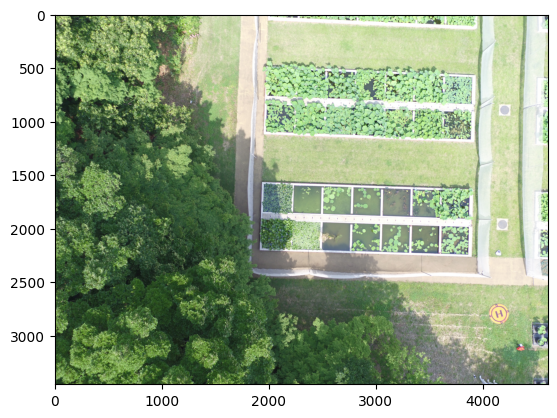

In [5]:
img = plt.imread(img_path)  

plt.imshow(img)
plt.show()

In [6]:
# the function to convert bbox to polygon coordinates
def bbox2coord(bbox):
    horizontal, vertical, width, height = bbox

    out = np.array([
        [horizontal, vertical],
        [horizontal, vertical-height],
        [horizontal+width, vertical-height],
        [horizontal+width, vertical],
        [horizontal, vertical],
    ])

    return out

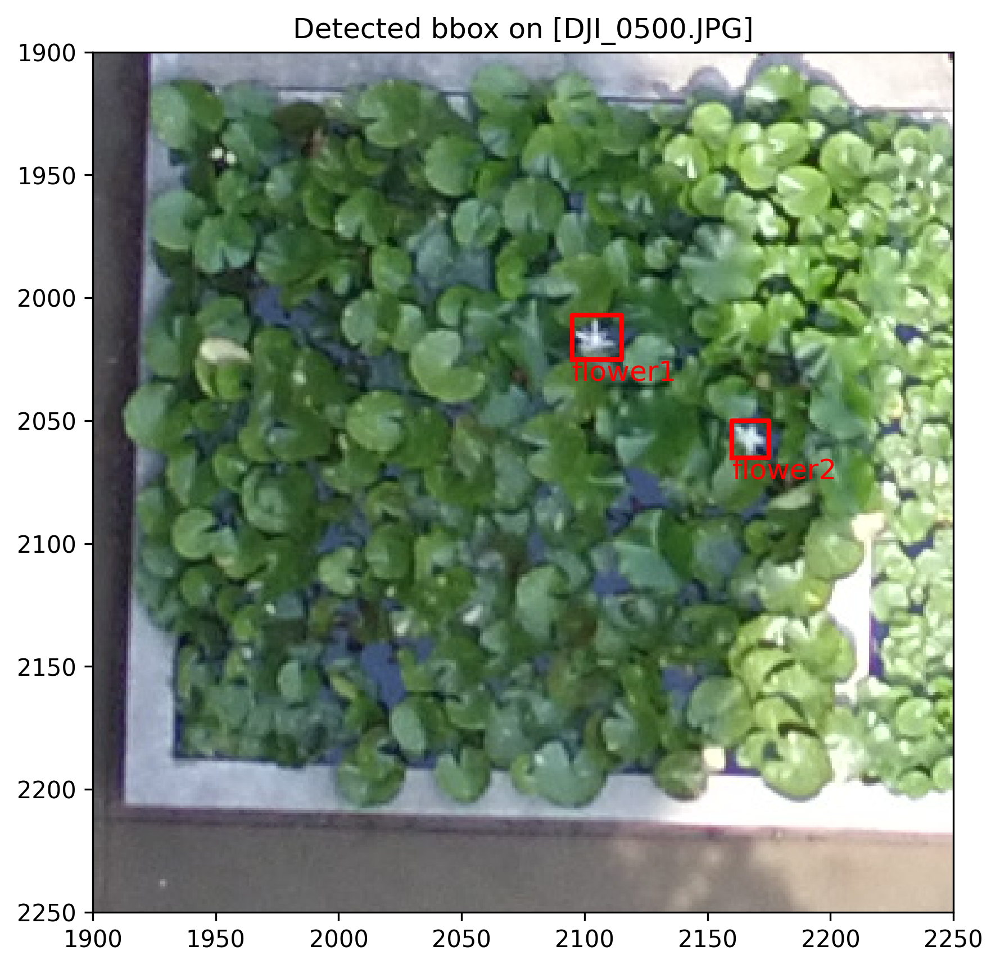

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6), dpi=300)

ax.imshow(img)

# convert bbox to coordinates
for k, v in bbox.items():
    bb = bbox2coord(v)
    ax.plot(*bb.T, color='r', lw=2)
    ax.text(*bb[0], k, color='r', fontsize=12, ha='left', va='top')

ax.set_xlim(1900, 2250)
ax.set_ylim(1900, 2250)
ax.invert_yaxis()
ax.set_title(f"Detected bbox on [DJI_0500.JPG]")
plt.tight_layout()

plt.show()

To obtian the geolocations of these results by EasyIDP by projective transformation, we need to prepare the following inputs:

1. Spliting the whole field to several small regions (plots) and get their geolocations.
2. Get plot boundary corresponding pixel coordinates on raw images by forward projection.
3. Get the transformation matrix between the original image and the small regions
4. Apply the transformation matrix to the bbox pixel coordinates to get the geolocations of the results.

## Step 1: load small region shpfile

Check the columns of shapefile of small regions (plot)

In [8]:
idp.shp.show_shp_fields(lotus.shp)   
# `lotus.shp`` is the file path string to the shapefile of the lotus plot

  [-1] #   [0] plot_id
--------  -------------
       0      N1W1
       1      N1W2
       2      N1W3
     ...       ...
     109      S4E5
     110      S4E6
     111      S4E7


We would like to using `[0] plot_id` as the key of output dictionary.

In [9]:
grid = idp.ROI(lotus.shp, name_field="plot_id")
grid.get_z_from_dsm(lotus.metashape.dsm)   # `lotus.metashape.dsm` is also a file path string

[shp][proj] Use projection [WGS 84] for loaded shapefile [plots.shp]


[shp] Read shapefile [plots.shp]: 100%|██████████| 112/112 [00:00<00:00, 3516.26it/s]
Read z values of roi from DSM [170531.Lotus_dsm.tif]:   0%|          | 0/112 [00:00<?, ?it/s]

Read z values of roi from DSM [170531.Lotus_dsm.tif]: 100%|██████████| 112/112 [00:00<00:00, 160.09it/s]


Then check one plot boundary polygon and its vertices geolocation

In [10]:
grid['N1W1']

array([[ 368017.7565143 , 3955511.08102277,      97.39836121],
       [ 368019.70190232, 3955511.49811902,      97.39836121],
       [ 368020.11263046, 3955509.54636219,      97.39836121],
       [ 368018.15769062, 3955509.13563382,      97.39836121],
       [ 368017.7565143 , 3955511.08102277,      97.39836121]])

This is not a standard longtitude, latitude in degrees format. Instead, it is using a different geolocation system (CRS), which using meter as units and more suitable for geodetic applications. Since (X, Y, Z) are all in meters.

In [11]:
grid.crs

<Projected CRS: EPSG:32654>
Name: WGS 84 / UTM zone 54N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 138°E and 144°E, northern hemisphere between equator and 84°N, onshore and offshore. Japan. Russian Federation.
- bounds: (138.0, 0.0, 144.0, 84.0)
Coordinate Operation:
- name: UTM zone 54N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Step 2: Geolocation to pixel coordinates

In [12]:
# load the reconstruction project
ms = idp.Metashape(
    lotus.metashape.project, chunk_id=0, 
    raw_img_folder=lotus.photo)

ms

<'170531.Lotus.psx' easyidp.Metashape object with 1 active chunks>

  id  label
----  -------
-> 0  Chunk 1

Calcuate the pixel coordinates of all plot boundary vertices

In [13]:
grid_raw = ms.back2raw(grid)
grid_raw["N1W1"]

Backward roi to raw images: 100%|██████████| 112/112 [00:01<00:00, 85.59it/s]


{'DJI_0479': array([[  43.91987229, 1247.04066867],
        [  69.0221046 ,  972.89938018],
        [ 353.25370817,  993.30409359],
        [ 328.10701394, 1267.40353364],
        [  43.91987229, 1247.04066867]]),
 'DJI_0480': array([[ 655.36785888, 1273.01418092],
        [ 681.18303761,  996.4866665 ],
        [ 965.60719523, 1019.55346144],
        [ 939.89408896, 1296.05588162],
        [ 655.36785888, 1273.01418092]]),
 'DJI_0481': array([[1024.43757184, 1442.10211951],
        [1043.51451272, 1159.41597   ],
        [1331.67724595, 1177.40543929],
        [1312.55275279, 1460.0493473 ],
        [1024.43757184, 1442.10211951]]),
 'DJI_0482': array([[ 924.40250213, 2201.23504281],
        [ 942.63018056, 1910.46713471],
        [1235.98844832, 1923.81031834],
        [1217.80721091, 2214.52736132],
        [ 924.40250213, 2201.23504281]]),
 'DJI_0483': array([[ 842.89809098, 2972.20979588],
        [ 861.62293923, 2676.51568097],
        [1156.39840328, 2686.82526831],
        [113

As we can see, each plot can be viewed by multiple images, so it gives multiple outputs pixel coordinates on different images.

For most of the case, if the plot is in image center, if suffers less from lens distortion. So we want to find out which image is the most center of given plot.

In [14]:
closest_img = ms.sort_img_by_distance(grid_raw, grid, num=1)

closest_img['N1W1']

Filter by distance to ROI: 100%|██████████| 112/112 [00:00<00:00, 4096.54it/s]


{'DJI_0500': array([[1922.56317387, 2186.55026211],
        [1931.87582434, 1925.40596027],
        [2192.1757749 , 1934.43920442],
        [2182.74834419, 2195.88054775],
        [1922.56317387, 2186.55026211]])}

Now we can see, for plot id `N1W1`, the closest image is `DJI_0500.JPG` and the correspoinding pixel coordinates. It is wrapping by the image name, to get the pixel coordinates, we need to tell the image name

In [15]:
closest_img['N1W1']['DJI_0500']

array([[1922.56317387, 2186.55026211],
       [1931.87582434, 1925.40596027],
       [2192.1757749 , 1934.43920442],
       [2182.74834419, 2195.88054775],
       [1922.56317387, 2186.55026211]])

Or just using index of dict.keys()

In [16]:
img_name = list(closest_img['N1W1'])[0]
img_name

'DJI_0500'

In [17]:
img_coord = closest_img['N1W1'][img_name]
img_coord

array([[1922.56317387, 2186.55026211],
       [1931.87582434, 1925.40596027],
       [2192.1757749 , 1934.43920442],
       [2182.74834419, 2195.88054775],
       [1922.56317387, 2186.55026211]])

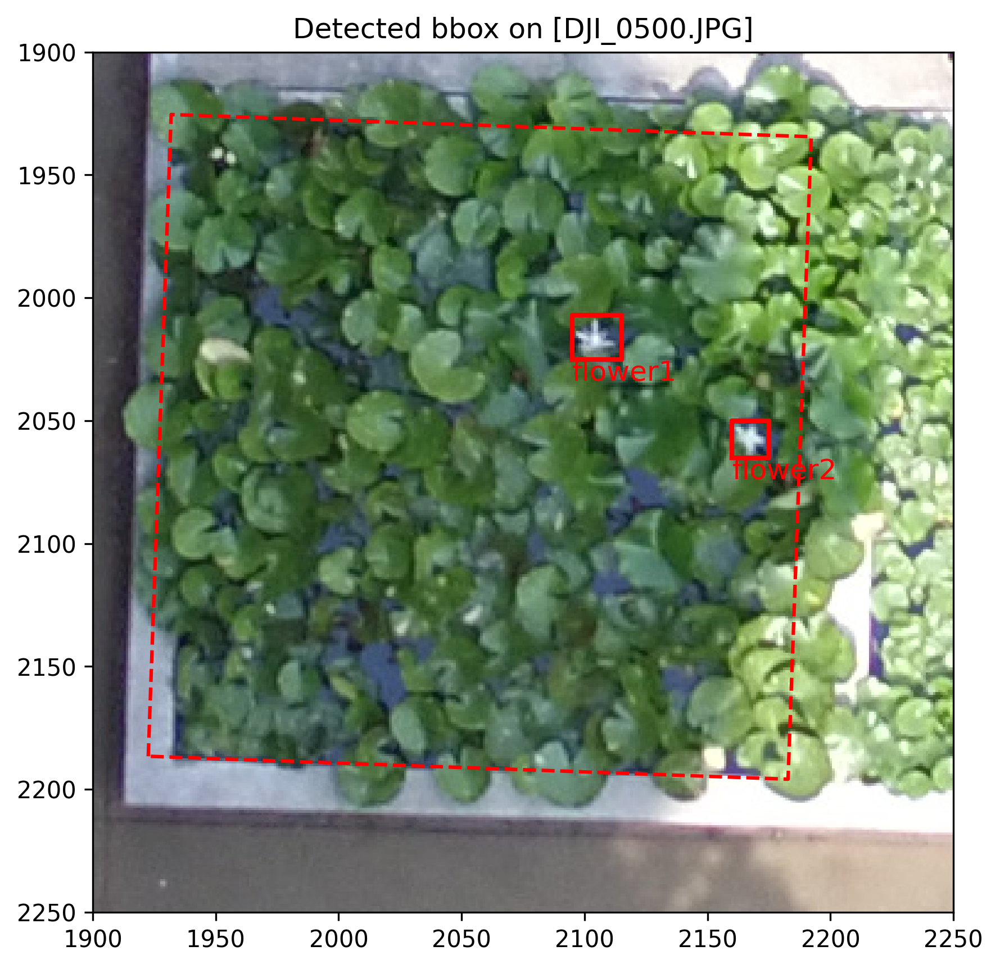

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6), dpi=300)

ax.imshow(img)

# show the plot boundary
ax.plot(*closest_img['N1W1'][img_name].T, '--r')

# convert bbox to coordinates
for k, v in bbox.items():
    bb = bbox2coord(v)
    ax.plot(*bb.T, color='r', lw=2)
    ax.text(*bb[0], k, color='r', fontsize=12, ha='left', va='top')

ax.set_xlim(1900, 2250)
ax.set_ylim(1900, 2250)
ax.invert_yaxis()
ax.set_title(f"Detected bbox on [DJI_0500.JPG]")
plt.tight_layout()

plt.show()

## Step 3: Calculate the transform matrix from geolocation to image coordinates

In [19]:
from skimage.transform import ProjectiveTransform

In [20]:
grid_coord = grid['N1W1'][:,0:2]

print("ROI pixel coords on DOM")
print(grid_coord, "\n")
print("ROI pixel coords on the raw image")
print(img_coord)

ROI pixel coords on DOM
[[ 368017.7565143  3955511.08102277]
 [ 368019.70190232 3955511.49811902]
 [ 368020.11263046 3955509.54636219]
 [ 368018.15769062 3955509.13563382]
 [ 368017.7565143  3955511.08102277]] 

ROI pixel coords on the raw image
[[1922.56317387 2186.55026211]
 [1931.87582434 1925.40596027]
 [2192.1757749  1934.43920442]
 [2182.74834419 2195.88054775]
 [1922.56317387 2186.55026211]]


Estimate the transformation matrix from geolocation to pixel coordinate

In [21]:
pt = ProjectiveTransform()
pt.estimate(grid_coord, img_coord)

pt

<ProjectiveTransform(matrix=
    [[     0.01087185,     -0.03883751, 149621.76035049],
     [    -0.03699766,     -0.01004429,  53346.76650501],
     [     0.00000064,     -0.00000031,      1.        ]]) at 0x28b091527d0>

## Step 4: Apply the transformation on the detection bbox

To transfer pixel coordinate to geolocations

In [22]:
dom_bbox_geo = {}
for k, v in bbox.items():
    bb = bbox2coord(v)
    out = pt.inverse(bb)
    dom_bbox_geo[k] = out

dom_bbox_geo

{'flower1': array([[ 368019.26210001, 3955510.1024057 ],
        [ 368019.39550687, 3955510.13569698],
        [ 368019.4320833 , 3955509.98700125],
        [ 368019.29863637, 3955509.95373934],
        [ 368019.26210001, 3955510.1024057 ]]),
 'flower2': array([[ 368019.08439443, 3955509.54527879],
        [ 368019.19554742, 3955509.57291005],
        [ 368019.22294768, 3955509.46127914],
        [ 368019.11176965, 3955509.43366629],
        [ 368019.08439443, 3955509.54527879]])}

If want to transfer to longitude and latitude:

In [23]:
import pyproj

In [24]:
idp.geotools.convert_proj(
    shp_dict=dom_bbox_geo,
    crs_origin=grid.crs,
    crs_target= pyproj.CRS.from_epsg(4326)
)

{'flower1': array([[139.54054643,  35.73474332],
        [139.5405479 ,  35.73474364],
        [139.54054832,  35.73474231],
        [139.54054685,  35.73474199],
        [139.54054643,  35.73474332]]),
 'flower2': array([[139.54054455,  35.73473828],
        [139.54054578,  35.73473854],
        [139.5405461 ,  35.73473754],
        [139.54054487,  35.73473728],
        [139.54054455,  35.73473828]])}

Then lets visualize them on the field map.

In [25]:
dom = idp.GeoTiff(lotus.metashape.dom)

But in python, we cannot plot figures by geolocations directly. We need to convert the geolocations to pixel on GeoTiff for visualization

In [26]:
dom_bbox_px_dom = {}
for k, v in dom_bbox_geo.items():
    dom_bbox_px_dom[k] = idp.geotiff.geo2pixel(v, dom.header)

dom_bbox_px_dom

{'flower1': array([[ 632.69835707, 1519.17531844],
        [ 650.76394403, 1514.66710449],
        [ 655.71702287, 1534.80306772],
        [ 637.64600876, 1539.30730343],
        [ 632.69835707, 1519.17531844]]),
 'flower2': array([[ 608.63396024, 1594.61989826],
        [ 623.68598997, 1590.8781495 ],
        [ 627.39645726, 1605.99489751],
        [ 612.34103644, 1609.73415388],
        [ 608.63396024, 1594.61989826]])}

<function matplotlib.pyplot.show(close=None, block=None)>

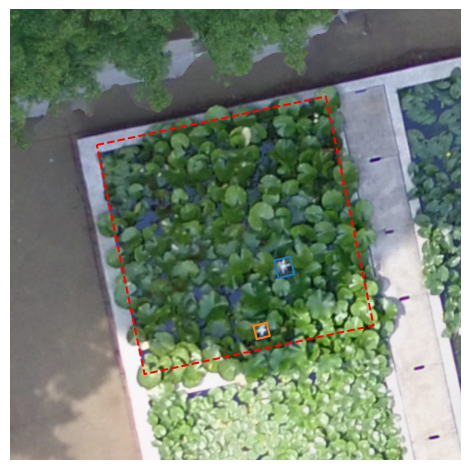

In [27]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=96)

# draw roi on dom
buffer = 100 # pixel
## perpare cropped dom in pixel with buffer
plot_pixel_coord = idp.geotiff.geo2pixel(grid["N1W1"], dom.header, return_index=True)
dom_xmin, dom_ymin = plot_pixel_coord.min(axis=0)
dom_xmax, dom_ymax = plot_pixel_coord.max(axis=0)
dom_grid_crop = dom.crop_rectangle(
    left = dom_xmin-buffer, 
    top = dom_ymin-buffer, 
    w=dom_xmax - dom_xmin + buffer * 2, 
    h=dom_ymax - dom_ymin + buffer * 2, 
    is_geo=False   # this is pixel coordinate on dom
)
ax.imshow(dom_grid_crop)

# draw plot boundries
offset_coord = plot_pixel_coord - np.array([dom_xmin-buffer, dom_ymin-buffer])
ax.plot(*offset_coord.T, '--r')

# draw revised bbox
for k, v in dom_bbox_px_dom.items():
    bb = v - np.array([dom_xmin-buffer, dom_ymin-buffer])
    ax.plot(*bb.T)

plt.axis('off')
plt.tight_layout()
plt.show

# Case 2: Variable surface of forest canopy by AffineTransform

Use Florida Forest as example, and detecting birds on the canopy surface.

<center><img src="../_static/images/data/2022_florida_forestbirds.png" alt="forest plot" width="61%"/></center>

In [28]:
fb = idp.data.ForestBirds()

In [29]:
bbox = {
    "bird1": [1650, 3200, 50, 50],  #horizontal, vertical, width, height
    "bird2": [1980, 2500, 45, 40]
}

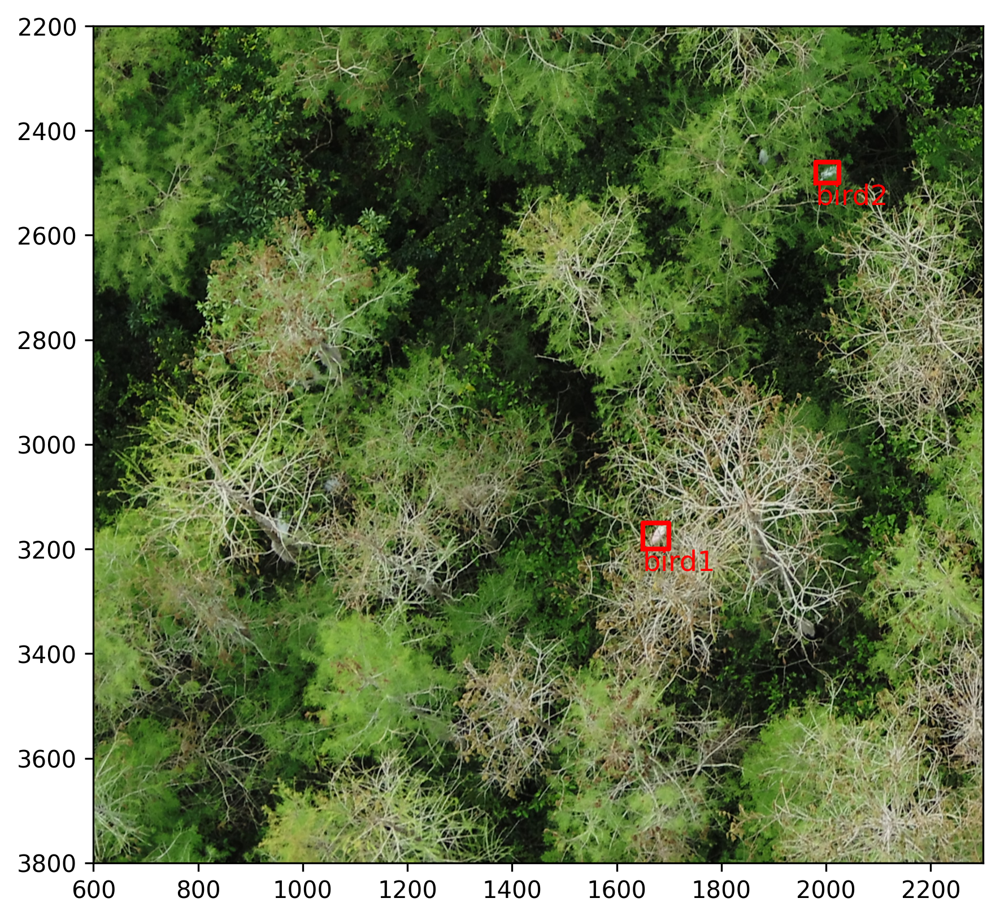

In [30]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6), dpi=300)

img_path = fb.photo / "DJI_0151.JPG"
img = plt.imread(img_path)

ax.imshow(img)

# convert bbox to coordinates
for k, v in bbox.items():
    bb = bbox2coord(v)
    ax.plot(*bb.T, color='r', lw=2)
    ax.text(*bb[0], k, color='r', fontsize=12, ha='left', va='top')

ax.set_xlim(600, 2300)
ax.set_ylim(2200, 3800)
ax.invert_yaxis()
plt.tight_layout()

plt.show()

Since the canopy surface have variable height, the previous projective transformation can not give accurate results. 

In [31]:
grid = idp.ROI(fb.shp, name_field="id")
grid.get_z_from_dsm(fb.metashape.dsm)

ms = idp.Metashape(
    fb.metashape.project, chunk_id=0, 
    raw_img_folder=fb.data_dir / "Hidden_Little_03_24_2022")

dom = idp.GeoTiff(fb.metashape.dom)
dsm = idp.GeoTiff(fb.metashape.dsm)

grid_raw = ms.back2raw(grid)
closest_img = ms.sort_img_by_distance(grid_raw, grid, num=1)
closest_img_name = list(closest_img['136'].keys())[0]

grid_coord = grid['136'][:,0:2]
img_coord = closest_img['136'][closest_img_name]

pt = ProjectiveTransform()
pt.estimate(grid_coord, img_coord)

dom_bbox_geo = {}
dom_bbox_px_dom = {}
for k, v in bbox.items():
    bb = bbox2coord(v)
    out = pt.inverse(bb)
    dom_bbox_geo[k] = out
    dom_bbox_px_dom[k] = idp.geotiff.geo2pixel(out, dom.header)

[shp][proj] Use projection [WGS 84] for loaded shapefile [Hidden_Little_grid.shp]


[shp] Read shapefile [Hidden_Little_grid.shp]: 100%|██████████| 178/178 [00:00<00:00, 1235.69it/s]


Could not find prefered [GTCitationGeoKey, PCSCItationGeoKey], but find [GeogCitationGeoKey]=WGS 84 instead for Coordinate Reference System (CRS)


Read z values of roi from DSM [Hidden_Little_03_24_2022_DEM.tif]: 100%|██████████| 178/178 [00:03<00:00, 52.28it/s]


Could not find prefered [GTCitationGeoKey, PCSCItationGeoKey], but find [GeogCitationGeoKey]=WGS 84 instead for Coordinate Reference System (CRS)
Could not find prefered [GTCitationGeoKey, PCSCItationGeoKey], but find [GeogCitationGeoKey]=WGS 84 instead for Coordinate Reference System (CRS)


Filter by distance to ROI: 100%|██████████| 178/178 [00:00<00:00, 32216.54it/s]


In [32]:
print("converted geolocation of detected birds")
dom_bbox_geo

converted geolocation of detected birds


{'bird1': array([[-80.83893806,  25.78301032],
        [-80.83893786,  25.78300682],
        [-80.83894172,  25.78300676],
        [-80.83894191,  25.78301027],
        [-80.83893806,  25.78301032]]),
 'bird2': array([[-80.83896128,  25.7829598 ],
        [-80.83896115,  25.78295686],
        [-80.83896471,  25.7829568 ],
        [-80.83896484,  25.78295974],
        [-80.83896128,  25.7829598 ]])}

<function matplotlib.pyplot.show(close=None, block=None)>

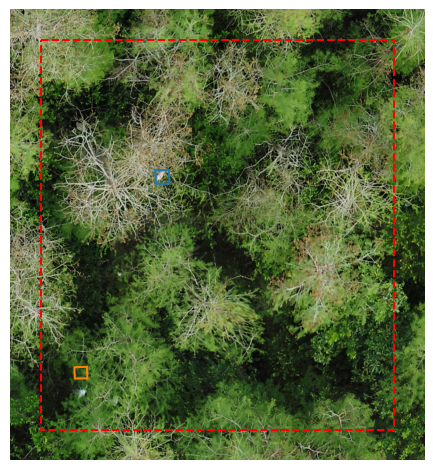

In [33]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=96)

# draw roi on dom
buffer = 100 # pixel
## perpare cropped dom in pixel with buffer
plot_pixel_coord = idp.geotiff.geo2pixel(grid["136"], dom.header, return_index=True)
dom_xmin, dom_ymin = plot_pixel_coord.min(axis=0)
dom_xmax, dom_ymax = plot_pixel_coord.max(axis=0)
dom_grid_crop = dom.crop_rectangle(
    left = dom_xmin-buffer, 
    top = dom_ymin-buffer, 
    w=dom_xmax - dom_xmin + buffer * 2, 
    h=dom_ymax - dom_ymin + buffer * 2, 
    is_geo=False   # this is pixel coordinate on dom
)
ax.imshow(dom_grid_crop)

# draw plot boundries
offset_coord = plot_pixel_coord - np.array([dom_xmin-buffer, dom_ymin-buffer])
ax.plot(*offset_coord.T, '--r')

# draw revised bbox
for k, v in dom_bbox_px_dom.items():
    bb = v - np.array([dom_xmin-buffer, dom_ymin-buffer])
    ax.plot(*bb.T)

plt.axis('off')
plt.tight_layout()
plt.show

We can see, the orange bird is not setting on a proper postion. Because ProjectiveTransform are only based on four vertex of plot boundary. It assumes that the content inside the plot is flat and constant. 

However, forest canopy have variable height, we need taking the elevation variation into account.

Thus, we proposed an dot matrix and affinee transformation apporach to getting better results. It follows the following steps:

1. Split the whole file into small patches, and read the geolocationf each patch boundary.
2. Create a dot matrix cover the patch boundary.
3. Getting the pixel coordinates of dot matrix in the raw images.
4. Calcuate the Affine transformation matrix based on the dot matrix.
5. Apply affine transformation to detected objects

## Step 1: load small patch shpfile

In [34]:
grid = idp.ROI(fb.shp, name_field="id")
grid.get_z_from_dsm(dsm, keep_crs=True)
grid['136']

[shp][proj] Use projection [WGS 84] for loaded shapefile [Hidden_Little_grid.shp]


[shp] Read shapefile [Hidden_Little_grid.shp]: 100%|██████████| 178/178 [00:00<00:00, 1358.58it/s]
Read z values of roi from DSM [Hidden_Little_03_24_2022_DEM.tif]: 100%|██████████| 178/178 [00:03<00:00, 47.32it/s]


array([[-80.83897435,  25.78304364, -30.15558052],
       [-80.83887435,  25.78304364, -30.15558052],
       [-80.83887435,  25.78294364, -30.15558052],
       [-80.83897435,  25.78294364, -30.15558052],
       [-80.83897435,  25.78304364, -30.15558052]])

The grid coordinates are (longtitue, latitude, altitude) in degrees and meters.

## Step 2: generate dot matrix

In [35]:
grid_coord = grid['136'][:, 0:2]
grid_coord

array([[-80.83897435,  25.78304364],
       [-80.83887435,  25.78304364],
       [-80.83887435,  25.78294364],
       [-80.83897435,  25.78294364],
       [-80.83897435,  25.78304364]])

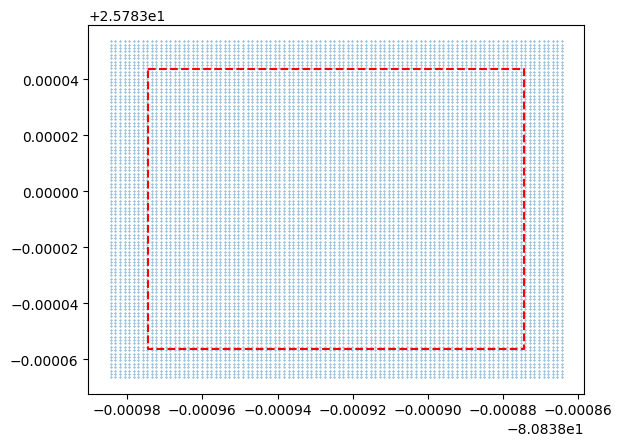

In [36]:
DOT_NUM = 100

xmin, ymin = grid_coord.min(axis=0)
xmax, ymax = grid_coord.max(axis=0)
xlen = xmax - xmin
ylen = ymax - ymin

buffer = xlen * 0.1

# create dot matrix
gridx = np.linspace(xmin - buffer, xmax + buffer, DOT_NUM)
gridy = np.linspace(ymin - buffer, ymax + buffer, DOT_NUM)

xx, yy = np.meshgrid(gridx, gridy)
dotmatrix = np.dstack([xx.flat, yy.flat])[0]

plt.plot(*grid_coord.T, 'r--')
plt.scatter(*dotmatrix.T, s=0.1)
plt.show()

The blue dots are generated dot matrix

## Step 3: getting pixel coordinates of dot matrix

To projecting geolocation to raw image, we need to know the depth (altitude) of each point from DSM

In [37]:
dotmatrix_geo3d = idp.ROI()
dotmatrix_geo3d.crs = grid.crs
dotmatrix_geo3d['136'] = dotmatrix

dom = idp.GeoTiff(fb.metashape.dom)
dsm = idp.GeoTiff(fb.metashape.dsm)
dotmatrix_geo3d.get_z_from_dsm(dsm, mode='point')

dotmatrix_geo3d

Could not find prefered [GTCitationGeoKey, PCSCItationGeoKey], but find [GeogCitationGeoKey]=WGS 84 instead for Coordinate Reference System (CRS)
Could not find prefered [GTCitationGeoKey, PCSCItationGeoKey], but find [GeogCitationGeoKey]=WGS 84 instead for Coordinate Reference System (CRS)


Read z values of roi from DSM [Hidden_Little_03_24_2022_DEM.tif]: 100%|██████████| 1/1 [00:12<00:00, 12.78s/it]


<easyidp.ROI> with 1 items
[0]	136
array([[-80.83898435,  25.78293364, -33.20880127],
       [-80.83898313,  25.78293364, -32.84751511],
       [-80.83898192,  25.78293364, -32.76753616],
       ...,
       [-80.83886677,  25.78305364, -28.50354385],
       [-80.83886556,  25.78305364, -28.44956017],
       [-80.83886435,  25.78305364, -28.32536888]])

We can see, we added the z values to dot matrix with variable heights.

Then, we projects the dot matrix to the image pixel coordinates.

In [38]:
def back2raw_dotmatrix(ms, coords, img_name):
    return ms._back2raw_one2one(
        ms._world2local(ms._crs2world(coords)), 
        img_name
    )

In [39]:
dotmatrix_pix_on_img = back2raw_dotmatrix(ms, dotmatrix_geo3d[0], closest_img_name)
dotmatrix_pix_on_img

array([[2296.49633185, 2245.00000397],
       [2280.30446956, 2234.13585816],
       [2265.2894815 , 2231.51582503],
       ...,
       [ 629.0112356 , 3798.01693439],
       [ 611.0363534 , 3797.15484268],
       [ 591.04215324, 3795.48443461]])

Lets check the results (no neet to pay attention to the code, just visualize the results)

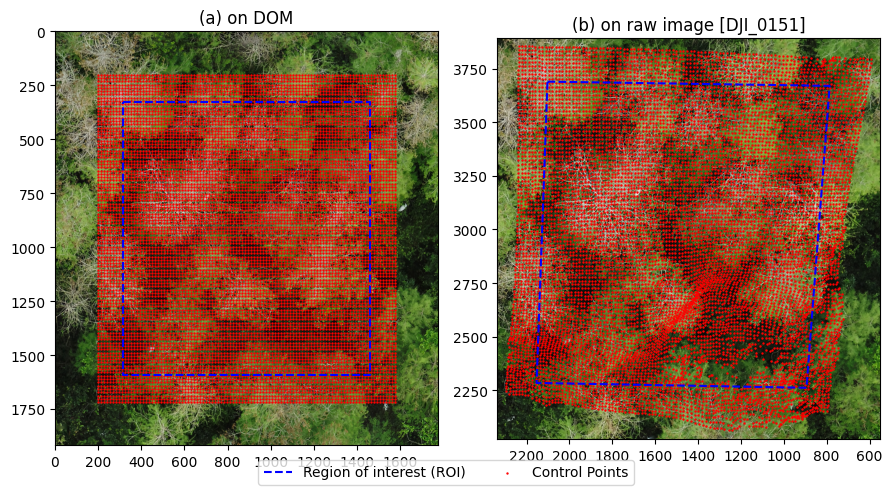

In [40]:
dotmatrix_pix_on_dom = dom.geo2pixel(dotmatrix_geo3d[0])

grid_pix_on_dom = dom.geo2pixel(grid_coord)
grid_pix_on_img = back2raw_dotmatrix(ms, grid['136'], closest_img_name)

#==============
fig, ax = plt.subplots(1,2, figsize=(9,5))

buffer = 200

dom_xmin, dom_ymin = dotmatrix_pix_on_dom.min(axis=0)
dom_xmax, dom_ymax = dotmatrix_pix_on_dom.max(axis=0)

dom_grid_crop = dom.crop_rectangle(
    left = int(dom_xmin - buffer),
    top  = int(dom_ymin - buffer),
    w    = int(dom_xmax - dom_xmin + buffer * 2),
    h    = int(dom_ymax - dom_ymin + buffer * 2),
    is_geo=False   # this is pixel coordinate on dom
)

ax[0].imshow(dom_grid_crop[:,:,0:3])
offset_coord = grid_pix_on_dom - np.array([dom_xmin-buffer, dom_ymin-buffer])
ax[0].plot(*offset_coord.T, '--b', label='Region of interest (ROI)')

offset_ctrl_pts = dotmatrix_pix_on_dom - np.array([dom_xmin-buffer, dom_ymin-buffer])
ax[0].scatter(*offset_ctrl_pts.T, s=0.5, c='r', label='Control Points')

# ax[0].axis('off')

ax[0].set_title('(a) on DOM')

img_np = plt.imread(ms.photos[closest_img_name].path)
ax[1].imshow(img_np)

ax[1].scatter(dotmatrix_pix_on_img[:,0], dotmatrix_pix_on_img[:,1], s=0.5, c='r')
ax[1].plot(*grid_pix_on_img.T, 'b--')

bf = 40
xn,yn = dotmatrix_pix_on_img.min(axis=0)
xm,ym = dotmatrix_pix_on_img.max(axis=0)

ax[1].set_xlim([xn-bf, xm+bf])
ax[1].set_ylim([yn-bf, ym+bf])
ax[1].invert_xaxis()
# ax[1].axis('off')

ax[1].set_title(f'(b) on raw image [{closest_img_name}]')

fig.legend(loc='lower center', ncol=2)

plt.tight_layout()

plt.show()

## Step 4: Calculate the Affine transformation matrix

In [41]:
from skimage.transform import PiecewiseAffineTransform

In [42]:
print("ROI pixel coords on DOM")
print(dotmatrix, "\n")
print("ROI pixel coords on the raw image")
print(dotmatrix_pix_on_img)

ROI pixel coords on DOM
[[-80.83898435  25.78293364]
 [-80.83898313  25.78293364]
 [-80.83898192  25.78293364]
 ...
 [-80.83886677  25.78305364]
 [-80.83886556  25.78305364]
 [-80.83886435  25.78305364]] 

ROI pixel coords on the raw image
[[2296.49633185 2245.00000397]
 [2280.30446956 2234.13585816]
 [2265.2894815  2231.51582503]
 ...
 [ 629.0112356  3798.01693439]
 [ 611.0363534  3797.15484268]
 [ 591.04215324 3795.48443461]]


In [43]:
aff_tform = PiecewiseAffineTransform()
aff_tform.estimate(dotmatrix, dotmatrix_pix_on_img)

True

## Step 5: Apply the affine transformation to the image

In [44]:
dom_bbox_geo = {}
dom_bbox_px_dom = {}
for k, v in bbox.items():
    bb = bbox2coord(v)
    out = aff_tform.inverse(bb)
    dom_bbox_geo[k] = out
    dom_bbox_px_dom[k] = idp.geotiff.geo2pixel(out, dom.header)

dom_bbox_geo

{'bird1': array([[-80.83893819,  25.7830105 ],
        [-80.83893807,  25.7830071 ],
        [-80.83894203,  25.78300718],
        [-80.83894214,  25.78301057],
        [-80.83893819,  25.7830105 ]]),
 'bird2': array([[-80.83896166,  25.7829608 ],
        [-80.83896119,  25.78295698],
        [-80.8389644 ,  25.78295594],
        [-80.838965  ,  25.78296021],
        [-80.83896166,  25.7829608 ]])}

Visualize the results

<function matplotlib.pyplot.show(close=None, block=None)>

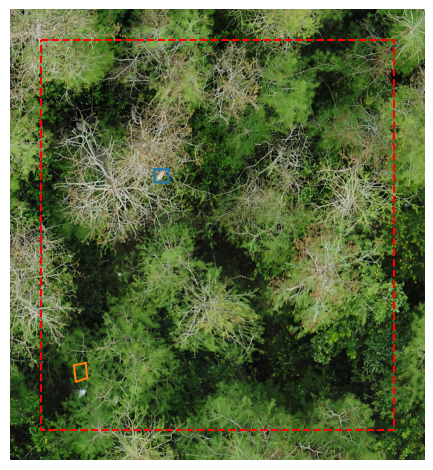

In [45]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=96)

# draw roi on dom
buffer = 100 # pixel
## perpare cropped dom in pixel with buffer
plot_pixel_coord = idp.geotiff.geo2pixel(grid["136"], dom.header, return_index=True)
dom_xmin, dom_ymin = plot_pixel_coord.min(axis=0)
dom_xmax, dom_ymax = plot_pixel_coord.max(axis=0)
dom_grid_crop = dom.crop_rectangle(
    left = dom_xmin-buffer, 
    top = dom_ymin-buffer, 
    w=dom_xmax - dom_xmin + buffer * 2, 
    h=dom_ymax - dom_ymin + buffer * 2, 
    is_geo=False   # this is pixel coordinate on dom
)
ax.imshow(dom_grid_crop)

# draw plot boundries
offset_coord = plot_pixel_coord - np.array([dom_xmin-buffer, dom_ymin-buffer])
ax.plot(*offset_coord.T, '--r')

# draw revised bbox
for k, v in dom_bbox_px_dom.items():
    bb = v - np.array([dom_xmin-buffer, dom_ymin-buffer])
    ax.plot(*bb.T)

plt.axis('off')
plt.tight_layout()
plt.show

Limited by DOM distortion, the forward projection is not perfect, but it is closer to reflect the changes of terrian.